### Завдання 1: Визначення дефектів на виробництві
- Сфера: промисловість / завод
- Завдання: розпізнати на фотографіях деталей дефекти:
    - клас 0 → деталь без дефектів
    - клас 1 → дефект (тріщина, подряпина, брак)
- Дані:
    - фото деталей (можна використовувати датасет Kaggle: Surface Defect Detection або створити власні).
    - Casting product image data for quality inspection
    - (https://www.kaggle.com/datasets/ravirajsinh45/real-life-industrial-dataset-of-casting-product/data)

--- Візуалізація прикладів зображень ---


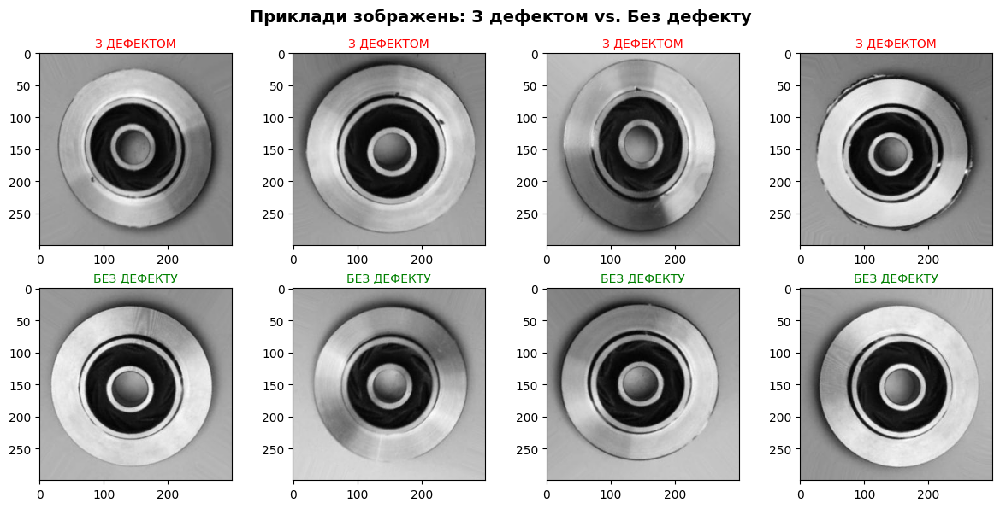


 ---------------------------------------------------------------------------

--- Аналіз розподілу даних по класах ---


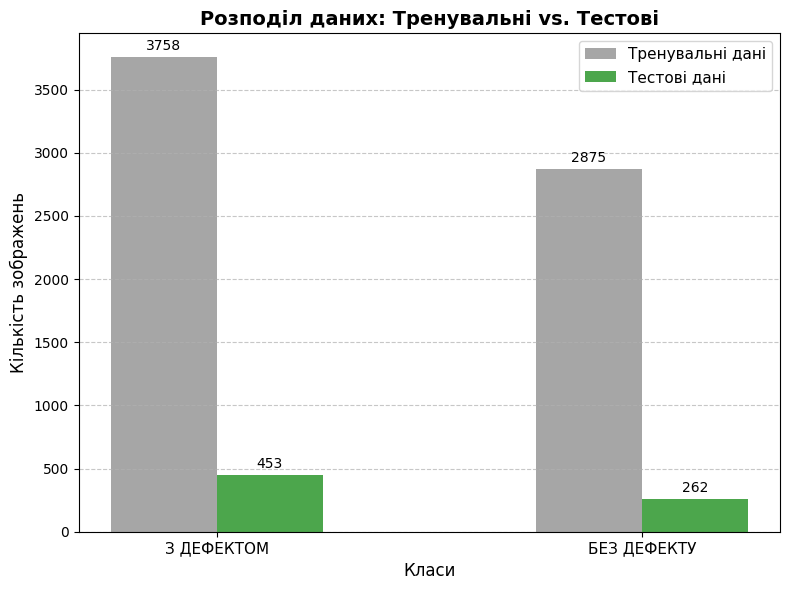


--- Створення архітектури моделі ---


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape             ┃          Param # ┃ Connected to              ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 300, 300, 3)      │                0 │ -                         │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block1_conv1 (Conv2D)         │ (None, 149, 149, 32)     │              864 │ input_layer_1[0][0]       │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block1_conv1_bn               │ (None, 149, 149, 32)     │              128 │ block1_conv1[0][0]        │
│ (BatchNormalization)          │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block1_conv1_act (Activation) │ (None, 149, 149, 32)     │                0 │ block1_conv1_bn[0][0]     │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block1_conv2 (Conv2D)         │ (None, 147, 147, 64)     │           18,432 │ block1_conv1_act[0][0]    │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block1_conv2_bn               │ (None, 147, 147, 64)     │              256 │ block1_conv2[0][0]        │
│ (BatchNormalization)          │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block1_conv2_act (Activation) │ (None, 147, 147, 64)     │                0 │ block1_conv2_bn[0][0]     │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block2_sepconv1               │ (None, 147, 147, 128)    │            8,768 │ block1_conv2_act[0][0]    │
│ (SeparableConv2D)             │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block2_sepconv1_bn            │ (None, 147, 147, 128)    │              512 │ block2_sepconv1[0][0]     │
│ (BatchNormalization)          │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block2_sepconv2_act           │ (None, 147, 147, 128)    │                0 │ block2_sepconv1_bn[0][0]  │
│ (Activation)                  │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block2_sepconv2               │ (None, 147, 147, 128)    │           17,536 │ block2_sepconv2_act[0][0] │
│ (SeparableConv2D)             │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block2_sepconv2_bn            │ (None, 147, 147, 128)    │              512 │ block2_sepconv2[0][0]     │
│ (BatchNormalization)          │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 74, 74, 128)      │            8,192 │ block1_conv2_act[0][0]    │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block2_pool (MaxPooling2D)    │ (None, 74, 74, 128)      │                0 │ block2_sepconv2_bn[0][0]  │
├───

 Total params: 21,386,538 (81.58 MB)

 Trainable params: 525,058 (2.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)


--- Створення генераторів даних ---
Found 5307 images belonging to 2 classes.
Found 1326 images belonging to 2 classes.
Found 715 images belonging to 2 classes.
Обчислені ваги класів: {0: np.float64(0.8824409710675092), 1: np.float64(1.153695652173913)}

--- Початок тренування моделі ---
Epoch 1/2
166/166 ━━━━━━━━━━━━━━━━━━━━ 691s 4s/step - accuracy: 0.8871 - loss: 0.2586 - val_accuracy: 0.9804 - val_loss: 0.0844 - learning_rate: 0.0010
Epoch 2/2
166/166 ━━━━━━━━━━━━━━━━━━━━ 620s 4s/step - accuracy: 0.9838 - loss: 0.0596 - val_accuracy: 0.9834 - val_loss: 0.0574 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 2.

--- Оцінка продуктивності моделі ---


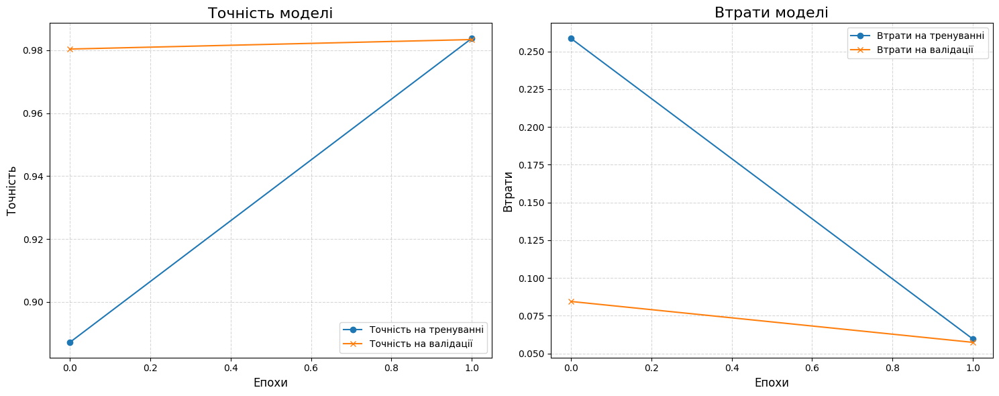


Оцінка на тестових даних:
23/23 ━━━━━━━━━━━━━━━━━━━━ 65s 3s/step - accuracy: 0.9846 - loss: 0.0429
Втрати на тесті: 0.0429
Точність на тесті: 0.9846
23/23 ━━━━━━━━━━━━━━━━━━━━ 66s 3s/step

--- Матриця плутанини ---


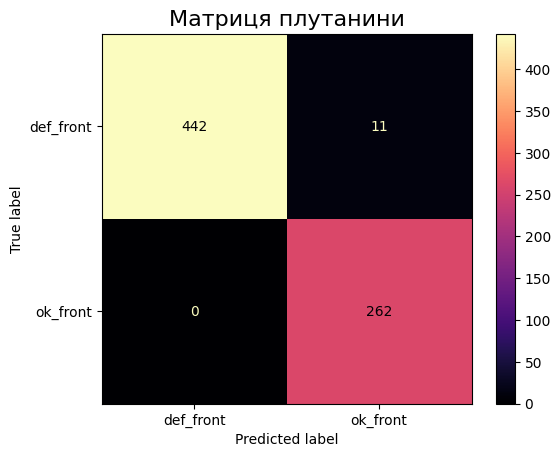


--- Звіт по класифікації ---
              precision    recall  f1-score   support

   def_front     1.0000    0.9757    0.9877       453
    ok_front     0.9597    1.0000    0.9794       262

    accuracy                         0.9846       715
   macro avg     0.9799    0.9879    0.9836       715
weighted avg     0.9852    0.9846    0.9847       715


--- Візуалізація Grad-CAM ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


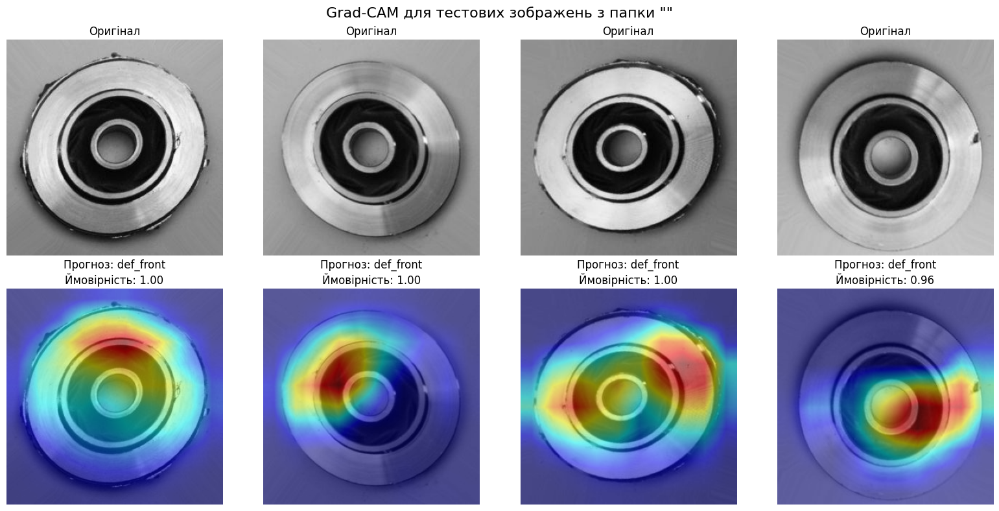

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


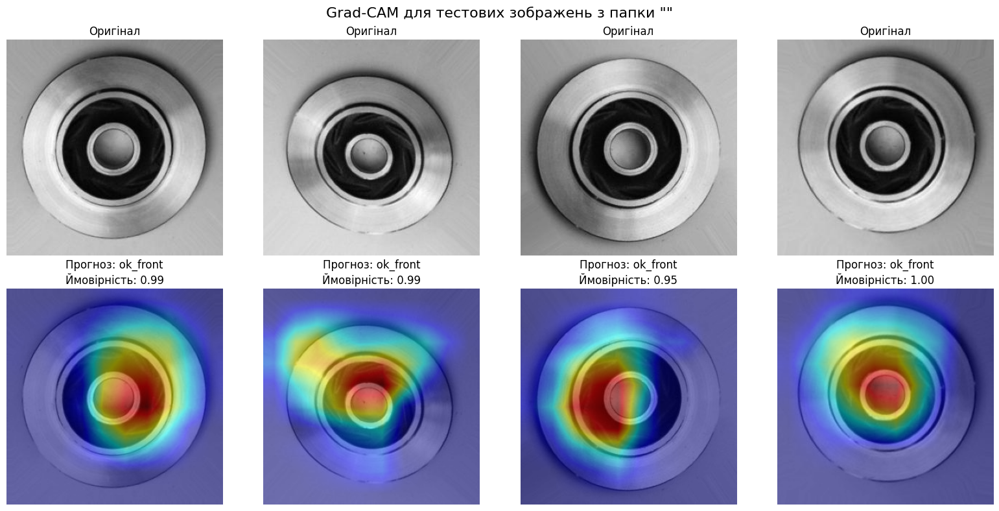


Модель успішно збережено у файл 'defect_detection_model.h5'


In [5]:
import os
import random
import warnings
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten
from tensorflow.keras.applications import Xception
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils.class_weight import compute_class_weight


# --- КРОК 0: Налаштуємо середовище
# Ігноруємо попередження для чистоти виводу
warnings.filterwarnings('ignore')

# Фіксуємо початкові стани для відтворюваності результатів
np.random.seed(42)
tf.random.set_seed(42)


# --- КРОК 1: ПІДГОТУЄМО ДАНІ
# Визначимо шляхів до даних
dataset = 'Automated Defect Detection'
train_data = f'{dataset}/casting_data/train'
test_data = f'{dataset}/casting_data/test'
train_defective = f'{train_data}/def_front/'
train_non_defective = f'{train_data}/ok_front/'
test_defective = f'{test_data}/def_front/'
test_non_defective = f'{test_data}/ok_front/'


print("--- Візуалізація прикладів зображень ---")
fig, axes = plt.subplots(2, 4, figsize=(12, 6))

defective_samples = os.listdir(train_defective)[:4]
non_defective_samples = os.listdir(train_non_defective)[:4]

for i, img_name in enumerate(defective_samples):
    img_path = os.path.join(train_defective, img_name)
    axes[0, i].imshow(plt.imread(img_path))
    axes[0, i].set_title('З ДЕФЕКТОМ', fontsize=10, color='red')

for i, img_name in enumerate(non_defective_samples):
    img_path = os.path.join(train_non_defective, img_name)
    axes[1, i].imshow(plt.imread(img_path))
    axes[1, i].set_title('БЕЗ ДЕФЕКТУ', fontsize=10, color='green')

plt.suptitle('Приклади зображень: З дефектом vs. Без дефекту', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


print("\n","-"*75)
print("\n--- Аналіз розподілу даних по класах ---")
x_train = np.array([len(os.listdir(train_defective)), len(os.listdir(train_non_defective))])
x_test = np.array([len(os.listdir(test_defective)), len(os.listdir(test_non_defective))])
labels = ['З ДЕФЕКТОМ', 'БЕЗ ДЕФЕКТУ']

fig, ax = plt.subplots(figsize=(8, 6))
bar_width = 0.25
x_indices = np.arange(len(labels))

train_bars = ax.bar(x_indices - bar_width / 2, x_train, bar_width, label='Тренувальні дані', color = 'gray', alpha=0.7)
test_bars = ax.bar(x_indices + bar_width / 2, x_test, bar_width, label='Тестові дані', color = 'green', alpha=0.7)

for bars in [train_bars, test_bars]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 5), 
                    textcoords="offset points", 
                    ha='center', 
                    fontsize=10, 
                    color='black')

ax.set_xlabel('Класи', fontsize=12)
ax.set_ylabel('Кількість зображень', fontsize=12)
ax.set_title('Розподіл даних: Тренувальні vs. Тестові', fontsize=14, fontweight='bold')
ax.set_xticks(x_indices)
ax.set_xticklabels(labels, fontsize=11)
ax.legend(fontsize=11)
ax.grid(True, linestyle='--', alpha=0.7, axis='y')
plt.tight_layout()
plt.show()


# --- КРОК 2: СТВОРИМО МОДЕЛІ (ТРАНСФЕРНЕ НАВЧАННЯ) ---
print("\n--- Створення архітектури моделі ---")
# Визначимо вхідний розмір зображень
input_shape = (300, 300, 3)

# Завантажуємо базову модель Xception, попередньо навчену на величезному датасеті ImageNet
# include_top=False означає, що ми не завантажуємо її власні класифікаційні шари
base_model = Xception(include_top=False, weights='imagenet', input_shape=input_shape)

# "Заморожуємо" ваги базової моделі.
base_model.trainable = False

x = base_model.output   # Додаємо наші власні шари для класифікації поверх базової моделі
x = GlobalAveragePooling2D()(x)   # GlobalAveragePooling2D усереднює ознаки по просторових вимірах, роблячи модель стійкішою до зсувів
x = Dense(256, activation='relu')(x) # Повнозв'язний шар для вивчення комбінацій ознак

predictions = Dense(2, activation='softmax')(x)  # Вихідний шар з 2 нейронами (для 2 класів) та активацією softmax

# Збираємо фінальну модель
model = Model(inputs=base_model.input, outputs=predictions)

# Компілюємо модель
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Виводимо архітектуру моделі
model.summary()

# --- КРОК 3: ПІДГОТУЄМО ГЕНЕРАТОР ДАНИХ 
print("\n--- Створення генераторів даних ---")
# Створюємо генератори, які будуть зчитувати зображення з папок
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2, 
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
)
test_datagen = ImageDataGenerator(rescale=1./255)

batch_size = 32
train_generator = train_datagen.flow_from_directory(
    train_data,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='training')

valid_generator = train_datagen.flow_from_directory(
    train_data,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation')

test_generator = test_datagen.flow_from_directory(
    test_data,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False) 

# Обчислюємо ваги класів, щоб збалансувати їх вплив під час навчання
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes)
class_weights = dict(enumerate(class_weights))
print(f"Обчислені ваги класів: {class_weights}")


# --- КРОК 4: ПОЧНЕМО НАВЧАННЯ МОДЕЛІ
print("\n--- Початок тренування моделі ---")
# Коллбеки для покращення процесу навчання
callbacks = [
    EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1)
]

history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=2, # Максимальна кількість епох, по правилам 20-40 (зробив 2, бо комп слабкий)
    callbacks=callbacks,
    class_weight=class_weights
)


# --- КРОК 5: ОЦІНЕМО ТА ІНТЕРПРЕТУЄМО РЕЗУЛЬТАТИ
print("\n--- Оцінка продуктивності моделі ---")

# Візуалізація історії навчання
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes[0].plot(history.history['accuracy'], label='Точність на тренуванні', marker='o')
axes[0].plot(history.history['val_accuracy'], label='Точність на валідації', marker='x')
axes[0].set_title('Точність моделі', fontsize=16)
axes[0].set_xlabel('Епохи', fontsize=12)
axes[0].set_ylabel('Точність', fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.5)
axes[0].legend()

axes[1].plot(history.history['loss'], label='Втрати на тренуванні', marker='o')
axes[1].plot(history.history['val_loss'], label='Втрати на валідації', marker='x')
axes[1].set_title('Втрати моделі', fontsize=16)
axes[1].set_xlabel('Епохи', fontsize=12)
axes[1].set_ylabel('Втрати', fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.5)
axes[1].legend()

plt.tight_layout()
plt.show()

print("\nОцінка на тестових даних:")
test_loss, test_acc = model.evaluate(test_generator)
print(f"Втрати на тесті: {test_loss:.4f}")
print(f"Точність на тесті: {test_acc:.4f}")

# Передбачення на тестових даних
y_pred_prob = model.predict(test_generator)
y_pred = np.argmax(y_pred_prob, axis=1)
y_actual = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Матриця плутанини
print("\n--- Матриця плутанини ---")
conf_matrix = confusion_matrix(y_actual, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
disp.plot(cmap='magma', colorbar=True)
plt.title('Матриця плутанини', fontsize=16)
plt.show()

# Звіт по класифікації
print("\n--- Звіт по класифікації ---")
report = classification_report(y_actual, y_pred, target_names=class_labels, digits=4)
print(report)

# --- КРОК 6: ПРОВЕДЕМО ІНТЕРПРЕТАЦІЮ ЗА ДОПОМОГОЮ GRAD-CAM
print("\n--- Візуалізація Grad-CAM ---")
def grad_cam(model, img_array, class_index, layer_name='block14_sepconv2_act'):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs[0]), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap

def display_gradcam(img_path, heatmap, alpha=0.5, color_map=cv2.COLORMAP_JET):
    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, color_map)
    superimposed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)
    return superimposed_img

# Функція для відображення Grad-CAM на випадкових тестових зображеннях
def plot_gradcam_for_test_images(model, test_folder, num_images=4):
    image_files = random.sample(os.listdir(test_folder), num_images)
    fig, axes = plt.subplots(2, num_images, figsize=(16, 8))
    for i, img_name in enumerate(image_files):
        img_path = os.path.join(test_folder, img_name)
        img_array = tf.keras.preprocessing.image.load_img(img_path, target_size=input_shape[:2])
        img_array = tf.keras.preprocessing.image.img_to_array(img_array)
        img_array = np.expand_dims(img_array, axis=0) / 255.0

        # Робимо передбачення для конкретного зображення
        prediction = model.predict(img_array)[0]
        class_index = np.argmax(prediction)
        predicted_class_name = class_labels[class_index]

        heatmap = grad_cam(model, img_array, class_index)
        superimposed_img = display_gradcam(img_path, heatmap)
        superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB) 

        axes[0, i].imshow(plt.imread(img_path))
        axes[0, i].set_title(f"Оригінал")
        axes[0, i].axis('off')
        axes[1, i].imshow(superimposed_img)
        axes[1, i].set_title(f"Прогноз: {predicted_class_name}\nЙмовірність: {prediction[class_index]:.2f}")
        axes[1, i].axis('off')
    plt.suptitle(f'Grad-CAM для тестових зображень з папки "{os.path.basename(test_folder)}"', fontsize=16)
    plt.tight_layout()
    plt.show()

# Візуалізуємо для дефектних та недефектних деталей
plot_gradcam_for_test_images(model, test_defective)
plot_gradcam_for_test_images(model, test_non_defective)

# Зберігаємо фінальну модель
model.save("defect_detection_model.h5")
print("\nМодель успішно збережено у файл 'defect_detection_model.h5'")


### Завдання 2: Виявлення шкідливих комах у сільському господарстві
- Сфера: агротехнології
- Завдання: класифікувати зображення рослин:
    - клас 0 → рослина здорова
    - клас 1 → присутні шкідники або хвороби
- Дані:
    - Можна використати PlantVillage Dataset (https://www.kaggle.com/datasets/emmarex/plantdisease/data)
    - Фото листя з різними хворобами та шкідниками.

Починаємо розділення та перегрупування датасету...
✅ Розділення датасету та перегрупування завершено!
Found 8523 images belonging to 2 classes.
Found 2608 images belonging to 2 classes.
Found 2609 images belonging to 2 classes.
Знайдені класи: ['здорова', 'хвора']


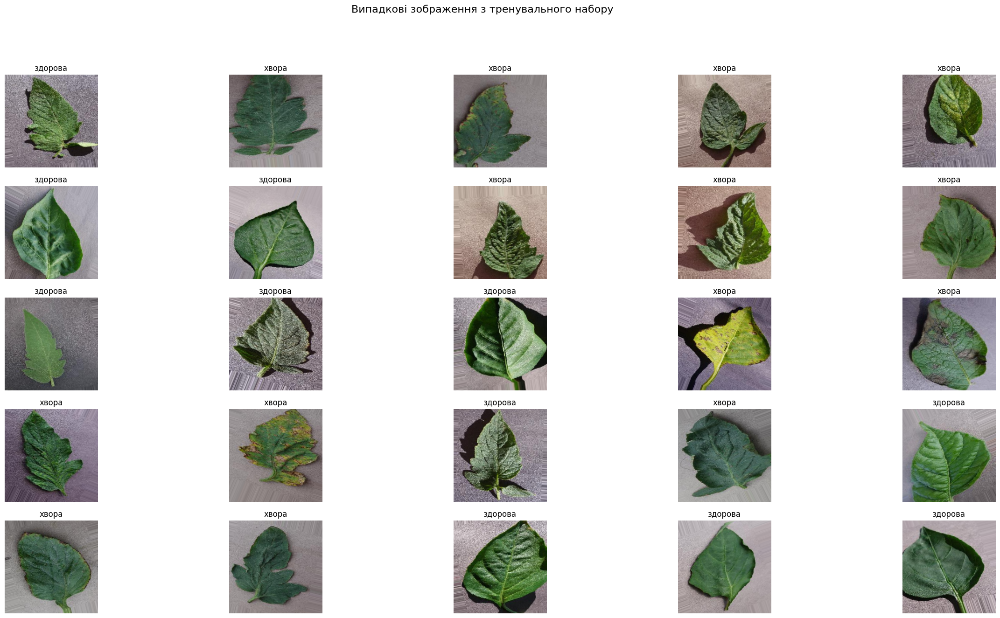

Розподіл класів у тренувальному наборі:
1    5594
0    2929
Name: count, dtype: int64


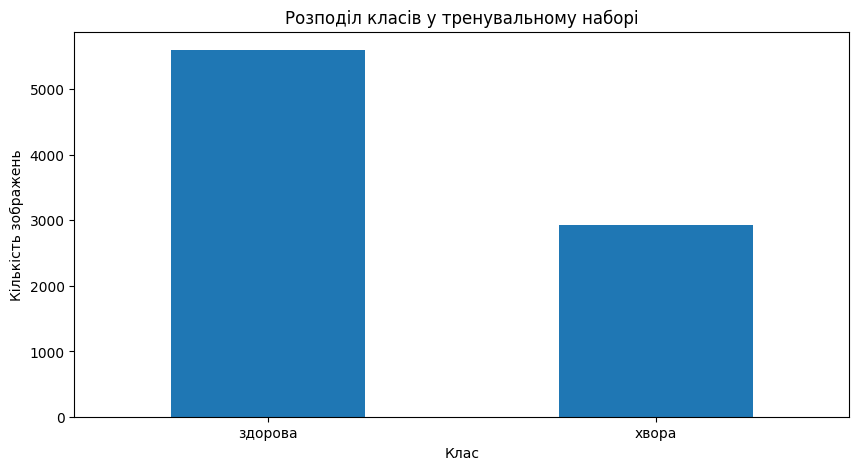

Вагові коефіцієнти класів: {0: np.float64(1.4549334243769205), 1: np.float64(0.7617983553807651)}


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape             ┃          Param # ┃ Connected to              ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)    │ (None, 224, 224, 3)      │                0 │ -                         │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)     │              864 │ input_layer_4[0][0]       │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)     │              128 │ Conv1[0][0]               │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)     │                0 │ bn_Conv1[0][0]            │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)     │              288 │ Conv1_relu[0][0]          │
│ (DepthwiseConv2D)             │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)     │              128 │ expanded_conv_depthwise[… │
│ (BatchNormalization)          │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)     │                0 │ expanded_conv_depthwise_… │
│ (ReLU)                        │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)     │              512 │ expanded_conv_depthwise_… │
│ (Conv2D)                      │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)     │               64 │ expanded_conv_project[0]… │
│ (BatchNormalization)          │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)     │            1,536 │ expanded_conv_project_BN… │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)     │              384 │ block_1_expand[0][0]      │
│ (BatchNormalization)          │                          │                  │                           │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)     │                0 │ block_1_expand_BN[0][0]   │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)     │                0 │ block_1_expand_relu[0][0] │
├───────────────────────────────┼──────────────────────────┼──────────────────┼───────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)       │              864 │ block_1_pad[0][0]         │
│ (DepthwiseConv2D)             │                          │                  │                           │
├───

 Total params: 3,045,698 (11.62 MB)

 Trainable params: 787,714 (3.00 MB)

 Non-trainable params: 2,257,984 (8.61 MB)


Починаємо навчання моделі...
Epoch 1/3
267/267 ━━━━━━━━━━━━━━━━━━━━ 173s 634ms/step - accuracy: 0.7988 - loss: 0.4273 - val_accuracy: 0.9264 - val_loss: 0.1944 - learning_rate: 1.0000e-04
Epoch 2/3
267/267 ━━━━━━━━━━━━━━━━━━━━ 175s 654ms/step - accuracy: 0.9206 - loss: 0.1981 - val_accuracy: 0.9594 - val_loss: 0.1104 - learning_rate: 1.0000e-04
Epoch 3/3
267/267 ━━━━━━━━━━━━━━━━━━━━ 169s 634ms/step - accuracy: 0.9384 - loss: 0.1546 - val_accuracy: 0.9647 - val_loss: 0.1002 - learning_rate: 1.0000e-04
✅ Навчання моделі завершено!


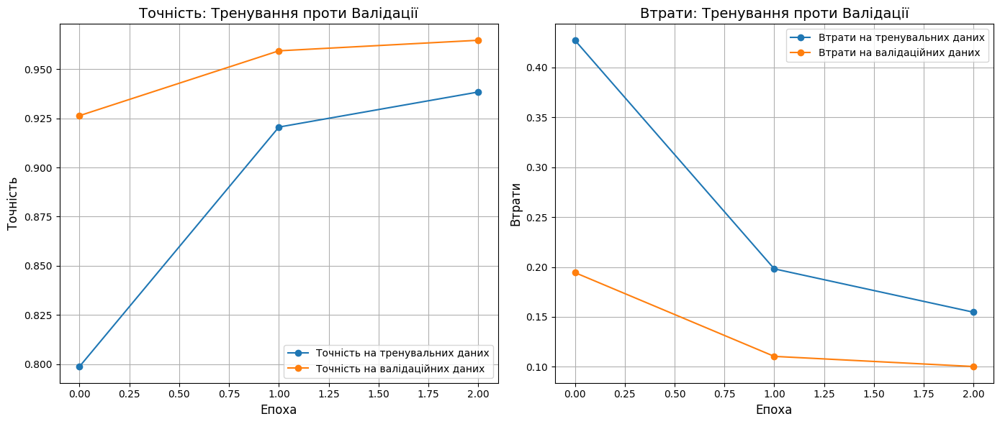


Оцінка моделі:
267/267 ━━━━━━━━━━━━━━━━━━━━ 146s 548ms/step - accuracy: 0.9625 - loss: 0.0974
Втрати на тренувальних даних: 0.0974
Точність на тренувальних даних: 0.9625
82/82 ━━━━━━━━━━━━━━━━━━━━ 26s 317ms/step - accuracy: 0.9647 - loss: 0.1002
Втрати на валідаційних даних: 0.1002
Точність на валідаційних даних: 0.9647
82/82 ━━━━━━━━━━━━━━━━━━━━ 27s 323ms/step - accuracy: 0.9621 - loss: 0.1017
Втрати на тестових даних: 0.1017
Точність на тестових даних: 0.9621

Аналіз прогнозування на тестовому наборі...
82/82 ━━━━━━━━━━━━━━━━━━━━ 29s 334ms/step


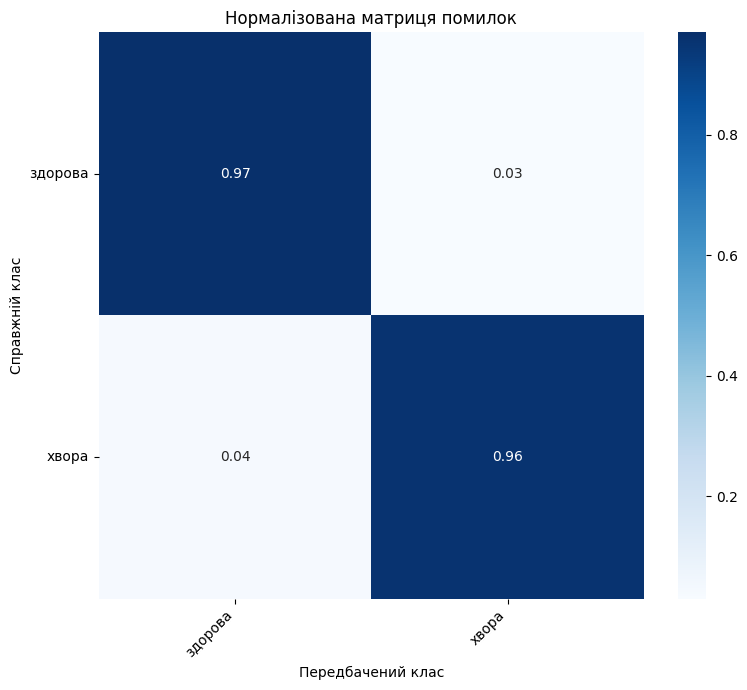


Звіт по класифікації:


              precision    recall  f1-score   support

     здорова      0.923     0.970     0.946       896
       хвора      0.984     0.958     0.971      1713

    accuracy                          0.962      2609
   macro avg      0.954     0.964     0.958      2609
weighted avg      0.963     0.962     0.962      2609

✅ Модель успішно збережено як 'plant_disease_binary_classifier.h5'

Тестування функції передбачення на окремих зображеннях:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Зображення 1: 'здорова' | Впевненість: 0.9482
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Зображення 2: 'хвора' | Впевненість: 0.9998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
Зображення 3: 'хвора' | Впевненість: 0.9893
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Зображення 4: 'хвора' | Впевненість: 0.9999


In [16]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import shutil
import random
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D # Додано GlobalAveragePooling2D
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Підготуємо дані
dataset_dir = 'PlantVillage'
data_dir = "PlantVillage"

# Базова директорія для розділених даних
base_dir = "plant_split" 
os.makedirs(base_dir, exist_ok=True)


# Механізм створення підпапок для тренувального, валідаційного та тестового наборів
splits = ["train", "val", "test"]
for split in splits:
    os.makedirs(os.path.join(base_dir, split), exist_ok=True)
    # Створення підпапок для класів "здорова" та "хвора"
    os.makedirs(os.path.join(base_dir, split, "здорова"), exist_ok=True)
    os.makedirs(os.path.join(base_dir, split, "хвора"), exist_ok=True)

# Розділемо датасет та перегрупуємо класи на "здорова" та "хвора"
print("Починаємо розділення та перегрупування датасету...")
for cls_name in os.listdir(data_dir):
    cls_path = os.path.join(data_dir, cls_name)
    if not os.path.isdir(cls_path):
        continue
    
    target_class_folder = "здорова" if "healthy" in cls_name.lower() else "хвора"
    
    images = os.listdir(cls_path)
    random.shuffle(images)
    
    n_total = len(images)
    n_train = int(0.7 * n_total)
    n_val = int(0.15 * n_total)
    
    train_imgs = images[:n_train]
    val_imgs = images[n_train:n_train+n_val]
    test_imgs = images[n_train+n_val:]
    
    for split, split_imgs in zip(["train", "val", "test"], [train_imgs, val_imgs, test_imgs]):
        split_cls_path = os.path.join(base_dir, split, target_class_folder)
        for img in split_imgs:
            src = os.path.join(cls_path, img)
            dst = os.path.join(split_cls_path, img)
            shutil.copy(src, dst)

print("✅ Розділення датасету та перегрупування завершено!")


# --- Налашттуємо генераторів зображень для збільшення даних ---
# Генератор для тренувальних даних (з аугментацією)
train_datagen = ImageDataGenerator(
    rescale = 1/255.,              # Масштабування пікселів до діапазону [0, 1]
    zoom_range = 0.1,              # Випадкове масштабування зображень
    shear_range = 0.1,             # Випадковий зсув зображень
    width_shift_range = 0.1,       # Випадкове горизонтальне зміщення
    height_shift_range = 0.1,      # Випадкове вертикальне зміщення
    rotation_range = 25,           # Випадковий поворот зображень до 25 градусів
    horizontal_flip = True,        # Випадкове горизонтальне відображення
    fill_mode = 'nearest'          # Режим заповнення для нових пікселів після трансформацій
)

# Генератори для валідаційних та тестових даних (тільки масштабування)
valid_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen  = ImageDataGenerator(rescale=1/255.)

# --- Завантажемо дані з директорій за допомогою генераторів ---
train_dataset = train_datagen.flow_from_directory(
    os.path.join(base_dir, "train"),
    target_size=(224, 224),        # Зміна розміру всіх зображень до 224x224 пікселів
    batch_size=32,                 # Кількість зображень для обробки за один раз
    class_mode='categorical'       # Режим для багатокласової класифікації (один гарячий вектор)
)

val_dataset = valid_datagen.flow_from_directory(
    os.path.join(base_dir, "val"),
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_dataset = test_datagen.flow_from_directory(
    os.path.join(base_dir, "test"),
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False     
)

# Отримаємо назвикласів
classes = sorted(os.listdir(os.path.join(base_dir, "train"))) 
print(f"Знайдені класи: {classes}")
# Очікуваний вивід: "Знайдені класи: ['здорова', 'хвора']"

# --- Візуалізація випадкових зображень з тренувального набору ---
x_batch, y_batch = next(train_dataset)
random_images = np.random.choice(len(x_batch), 25, replace=False)

plt.figure(figsize=(30, 15))
for n, i in enumerate(random_images):
    plt.subplot(5, 5, n+1)
    plt.imshow((x_batch[i] * 255).astype("uint8"))
    plt.axis('off')
    class_idx = np.argmax(y_batch[i])
    class_name = list(train_dataset.class_indices.keys())[list(train_dataset.class_indices.values()).index(class_idx)]
    plt.title(class_name)
plt.suptitle('Випадкові зображення з тренувального набору', fontsize=16) 
plt.show()

# --- Проаналізуємо розподілу класів у тренувальному наборі ---
train_distribution = pd.Series(train_dataset.classes).value_counts()
print("Розподіл класів у тренувальному наборі:")
print(train_distribution)


train_distribution.plot(kind='bar', figsize=(10,5), title="Розподіл класів у тренувальному наборі")
plt.xlabel("Клас")
plt.ylabel("Кількість зображень")
plt.xticks(ticks=range(len(classes)), labels=classes, rotation=0) # Коректні мітки по осі X
plt.show()

# --- Обчислимо вагові коефіцієнти класів ---
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_dataset.classes),
    y=train_dataset.classes
)
class_weights = dict(enumerate(class_weights))
print("Вагові коефіцієнти класів:", class_weights)


# --- Побудодуємо моделі за допомогою попередньо навченої MobileNetV2 ---
# Завантажимоя MobileNetV2, попередньо навченої на ImageNet, без верхнього шару
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Заморозимо шари базової моделі, щоб вони не змінювались під час навчання

# Додасо власні шари для задачі класифікації
x = base_model.output
x = GlobalAveragePooling2D()(x) 
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x) 
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x) 
x = Dense(len(classes), activation='softmax')(x)

# Створемо фінальну модель
model = tf.keras.Model(inputs=base_model.input, outputs=x)

# Компіляція моделі
model.compile(
    loss = 'categorical_crossentropy',
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), 
    metrics = ['accuracy']
)

model.summary()

# --- Налаштуємо колбеки для ефективного навчання ---
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',         # Відстежуємо валідаційні втрати
    patience=10,                # Зупиняємо, якщо val_loss не покращується протягом 10 епох
    restore_best_weights=True   # Відновлюємо ваги моделі з найкращою val_loss
)
learning_rate_reducer = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',         # Відстежуємо валідаційні втрати
    patience=5,                 # Знижуємо швидкість навчання, якщо val_loss не покращується 5 епох
    factor=0.2,                 # Знижуємо швидкість навчання на 20%
    verbose=1,                  # Виводимо повідомлення про зниження швидкості
    min_lr=0.000001             # Мінімальна швидкість навчання
)
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'best_model_binary.keras',  # Збереження моделі в файл
    monitor='val_loss',         # Відстежуємо валідаційні втрати
    save_best_only=True,        # Зберігаємо тільки модель з найкращою val_loss
    mode='min'
)


# --- Почнемо навчання моделі ---
print("\nПочинаємо навчання моделі...")
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=3,              # має бути 30-40, вибрав 3, бо малий за потужністю мій комп.
    callbacks=[earlystopping, learning_rate_reducer, checkpoint],
    class_weight=class_weights 
)
print("✅ Навчання моделі завершено!")

# --- Зробимо візуалізацію результатів навчання ---
plt.figure(figsize=(14,6))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], marker='o', label='Точність на тренувальних даних')
plt.plot(history.history['val_accuracy'], marker='o', label='Точність на валідаційних даних')
plt.title('Точність: Тренування проти Валідації', fontsize=14)
plt.xlabel('Епоха', fontsize=12)
plt.ylabel('Точність', fontsize=12)
plt.grid(True)
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], marker='o', label='Втрати на тренувальних даних')
plt.plot(history.history['val_loss'], marker='o', label='Втрати на валідаційних даних')
plt.title('Втрати: Тренування проти Валідації', fontsize=14)
plt.xlabel('Епоха', fontsize=12)
plt.ylabel('Втрати', fontsize=12)
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

# --- Проведемо оцінку моделі на різних наборах даних ---
print("\nОцінка моделі:")
loss, acc = model.evaluate(train_dataset)
print(f"Втрати на тренувальних даних: {loss:.4f}")
print(f"Точність на тренувальних даних: {acc:.4f}")

loss, acc = model.evaluate(val_dataset)
print(f"Втрати на валідаційних даних: {loss:.4f}")
print(f"Точність на валідаційних даних: {acc:.4f}")

loss, acc = model.evaluate(test_dataset)
print(f"Втрати на тестових даних: {loss:.4f}")
print(f"Точність на тестових даних: {acc:.4f}")

# --- Наші прогнози на тестовому наборі та метрики класифікації ---
print("\nАналіз прогнозування на тестовому наборі...")
probs = model.predict(test_dataset, verbose=1)
y_pred = np.argmax(probs, axis=1) 

y_true = test_dataset.classes
class_names_binary = list(test_dataset.class_indices.keys())

# Створимо матрицю помилок
cm = confusion_matrix(y_true, y_pred, labels=range(len(class_names_binary)))
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True) 

plt.figure(figsize=(8,7)) 
sns.heatmap(cm_norm, annot=True, fmt=".2f",
            xticklabels=class_names_binary, yticklabels=class_names_binary, cmap="Blues")
plt.xlabel("Передбачений клас"); plt.ylabel("Справжній клас"); plt.title("Нормалізована матриця помилок")
plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0)
plt.tight_layout(); plt.show()

print("\nЗвіт по класифікації:")
print(classification_report(y_true, y_pred, target_names=class_names_binary, digits=3))

# --- Збережемо моделі ---
model.save("plant_disease_binary_classifier.h5")
print("✅ Модель успішно збережено як 'plant_disease_binary_classifier.h5'")

# --- Добавимо функцію для прогнозування нового зображення ---
def predict_plant_health(img_path):
    img = tf.keras.utils.load_img(img_path, target_size=(224,224))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0 

    # Отримаємо передбачення
    preds = model.predict(img_array)
    
    # Визначемо клас та впевненості
    pred_class_idx = np.argmax(preds)
    predicted_class_name = class_names_binary[pred_class_idx]
    confidence = np.max(preds)

    return predicted_class_name, confidence

# --- Протестуємо функцію передбачення ---
print("\nТестування функції передбачення на окремих зображеннях:")
label, prob = predict_plant_health("PlantVillage/Pepper healthy/3d9886b0-d3cc-42d2-a41a-ec934b971bc9___JR_HL 8775.JPG") 
print(f"Зображення 1: '{label}' | Впевненість: {prob:.4f}")

label, prob = predict_plant_health("PlantVillage/Tomato Spider mites Two spotted spider mite/2ac9a09c-b68a-4dba-a5c9-ae740fc9b8d4___Com.G_SpM_FL 9651.JPG")
print(f"Зображення 2: '{label}' | Впевненість: {prob:.4f}")

label, prob = predict_plant_health("PlantVillage/Tomato Tomato mosaic virus/135dcfad-367c-483b-921b-5d24986c471c___PSU_CG 2221.JPG")
print(f"Зображення 3: '{label}' | Впевненість: {prob:.4f}")

label, prob = predict_plant_health("PlantVillage/Pepper Bacterial spot/4d20e159-894a-4718-a9f8-e866e7c5a3d9___JR_B.Spot 9025.JPG")
print(f"Зображення 4: '{label}' | Впевненість: {prob:.4f}")

### Завдання 3: Виявлення пошкоджень на дорогах
- Сфера: міська інфраструктура / транспорт
- Завдання: на фотографіях дорожнього покриття визначати:
    - клас 0 → дорога без пошкоджень
    - клас 1 → ями, тріщини, нерівності
- Дані:
    - Можна створити власний датасет із смартфонів або використати
        - Road Damage Dataset
        - Road damage classification and assessment
        - (https://www.kaggle.com/datasets/prudhvignv/road-damage-classification-and-assessment/data)

--- Інформація про датасет ---
Знайдено класи: ['good', 'poor', 'satisfactory', 'very_poor']
Розмір тренувального набору: 1447 зображень
Розмір валідаційного набору: 310 зображень
Розмір тестового набору: 311 зображень
Навчання буде проводитись на пристрої: cpu

ПОЧАТОК ЕКСПЕРИМЕНТУ 1: ТРАНСФЕРНЕ НАВЧАННЯ З RESNET18
Епоха 1/3
----------
Фаза: train | Втрати: 0.8561 Точність: 0.6876
Фаза: val | Втрати: 0.5311 Точність: 0.8194
Епоха 2/3
----------
Фаза: train | Втрати: 0.4218 Точність: 0.8956
Фаза: val | Втрати: 0.3663 Точність: 0.8903
Епоха 3/3
----------
Фаза: train | Втрати: 0.2988 Точність: 0.9212
Фаза: val | Втрати: 0.2929 Точність: 0.9194

Навчання завершено за 5хв 19с
Найкраща точність на валідації: 0.9194


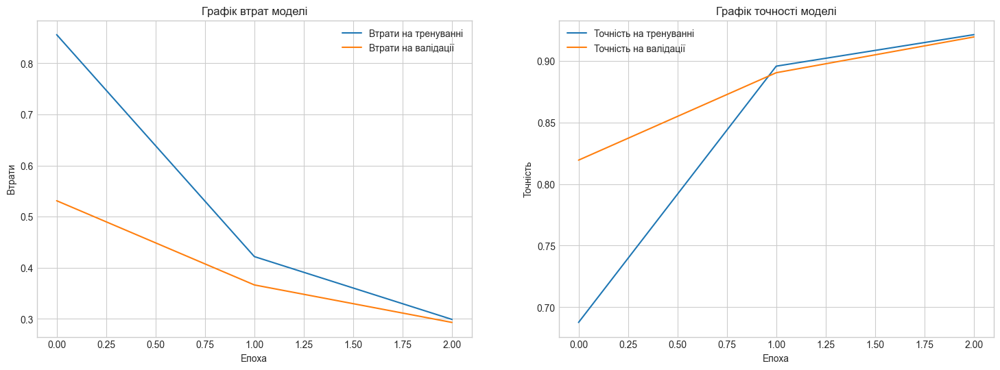


--- Звіт по класифікації на тестових даних ---
              precision    recall  f1-score   support

        good       0.99      1.00      1.00       127
        poor       0.87      0.77      0.81        60
satisfactory       0.87      0.90      0.88        77
   very_poor       0.92      1.00      0.96        47

    accuracy                           0.93       311
   macro avg       0.91      0.92      0.91       311
weighted avg       0.93      0.93      0.93       311


--- Матриця плутанини ---


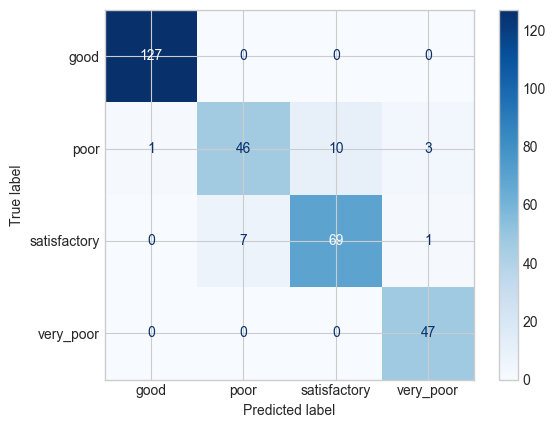


ПОЧАТОК ЕКСПЕРИМЕНТУ 2: ВЛАСНА ЗГОРТКОВА НЕЙРОННА МЕРЕЖА
Епоха 1/3
----------
Фаза: train | Втрати: 0.6330 Точність: 0.7464
Фаза: val | Втрати: 0.4369 Точність: 0.8387
Епоха 2/3
----------
Фаза: train | Втрати: 0.3196 Точність: 0.8798
Фаза: val | Втрати: 0.2561 Точність: 0.9097
Епоха 3/3
----------
Фаза: train | Втрати: 0.2597 Точність: 0.9032
Фаза: val | Втрати: 0.2521 Точність: 0.9032

Навчання завершено за 3хв 38с
Найкраща точність на валідації: 0.9097


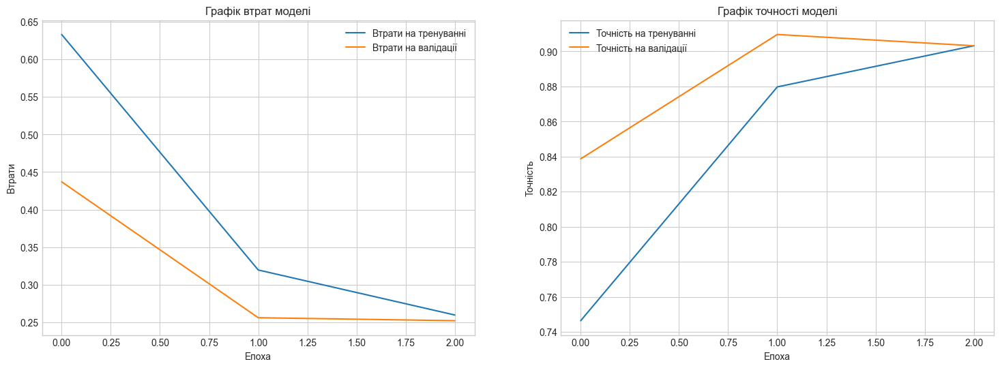


--- Звіт по класифікації на тестових даних ---
              precision    recall  f1-score   support

        good       0.99      1.00      1.00       127
        poor       0.81      0.80      0.81        60
satisfactory       0.82      0.86      0.84        77
   very_poor       1.00      0.94      0.97        47

    accuracy                           0.92       311
   macro avg       0.91      0.90      0.90       311
weighted avg       0.92      0.92      0.92       311


--- Матриця плутанини ---


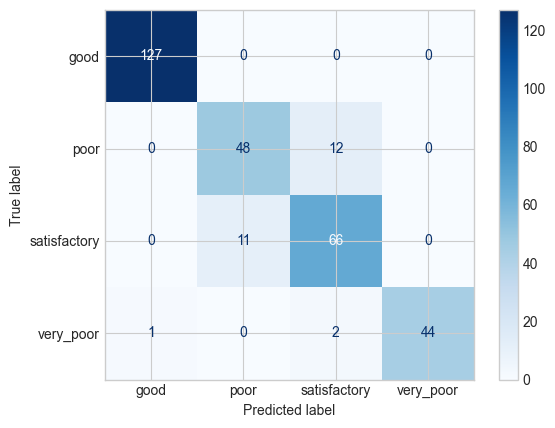


ВІЗУАЛІЗАЦІЯ ПЕРЕДБАЧЕНЬ МОДЕЛІ: RESNET18 (ТРАНСФЕРНЕ НАВЧАННЯ)


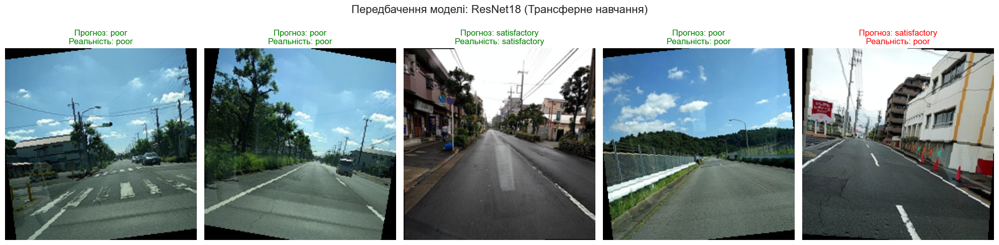


ВІЗУАЛІЗАЦІЯ ПЕРЕДБАЧЕНЬ МОДЕЛІ: ВЛАСНА CNN


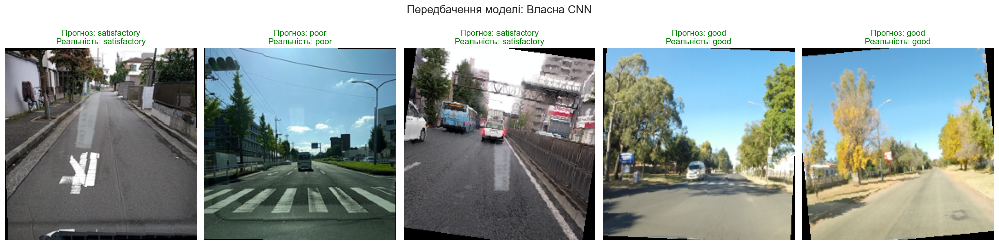

In [5]:
# --- КРОК 1: ПРОВЕДЕМО ІМПОРТ БІБЛІОТЕК
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import time
import os
from sklearn.model_selection import train_test_split
import random

plt.style.use('seaborn-v0_8-whitegrid')  # Встановимо стиль для графіків

# --- КРОК 2: ПІДГОТУЄМО ДАНІ  ---

# Визначимо трансформації для зображень
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


dataset_dir = 'sih_road_dataset'
full_dataset = datasets.ImageFolder(root=dataset_dir, transform=val_test_transform)

print("--- Інформація про датасет ---")
class_names = full_dataset.classes
print(f"Знайдено класи: {class_names}")

# Розділимо дані на індекси
indices = list(range(len(full_dataset)))
targets = full_dataset.targets
train_indices, remaining_indices = train_test_split(indices, test_size=0.3, random_state=42, stratify=targets)
val_indices, test_indices = train_test_split(remaining_indices, test_size=0.5, random_state=42, stratify=[targets[i] for i in remaining_indices])

print(f"Розмір тренувального набору: {len(train_indices)} зображень")
print(f"Розмір валідаційного набору: {len(val_indices)} зображень")
print(f"Розмір тестового набору: {len(test_indices)} зображень")

# Створимо підгрупи (Subsets)
train_subset = Subset(full_dataset, train_indices)
val_subset = Subset(full_dataset, val_indices)
test_subset = Subset(full_dataset, test_indices)
train_subset.dataset.transform = train_transform

# Створимо завантажувачі даних (DataLoaders)
batch_size = 32
train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_subset, batch_size=batch_size, shuffle=False)


# Визначаємо пристрій (GPU, якщо доступний)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Навчання буде проводитись на пристрої: {device}")


# --- КРОК 3: СТВОРИМО ФУНКЦІЇ ДЛЯ НАВЧАННЯ ТА ОЦІНКИ
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=3):  
    # Поставив 3 епохи, бо слабкий комп, але по правилам потрібно 30-40
    start_time = time.time()
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    best_model_wts = model.state_dict()
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Епоха {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                loader = train_loader
            else:
                model.eval()
                loader = val_loader

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in loader:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(loader.dataset)
            epoch_acc = running_corrects.double() / len(loader.dataset)

            if phase == 'train':
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc.item())
            else:
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc.item())
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = model.state_dict()

            print(f'Фаза: {phase} | Втрати: {epoch_loss:.4f} Точність: {epoch_acc:.4f}')

    time_elapsed = time.time() - start_time
    print(f'\nНавчання завершено за {time_elapsed // 60:.0f}хв {time_elapsed % 60:.0f}с')
    print(f'Найкраща точність на валідації: {best_acc:.4f}')
    model.load_state_dict(best_model_wts)
    return model, history

def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    ax1.plot(history['train_loss'], label='Втрати на тренуванні')
    ax1.plot(history['val_loss'], label='Втрати на валідації')
    ax1.set_title('Графік втрат моделі')
    ax1.set_xlabel('Епоха')
    ax1.set_ylabel('Втрати')
    ax1.legend()
    ax2.plot(history['train_acc'], label='Точність на тренуванні')
    ax2.plot(history['val_acc'], label='Точність на валідації')
    ax2.set_title('Графік точності моделі')
    ax2.set_xlabel('Епоха')
    ax2.set_ylabel('Точність')
    ax2.legend()
    plt.show()

def evaluate_model(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    print("\n--- Звіт по класифікації на тестових даних ---")
    print(classification_report(all_labels, all_preds, target_names=class_names))
    print("\n--- Матриця плутанини ---")
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

        # СТВОРЮ ДВІ МОДЕЛІ ДЛЯ НАВЧАННЯ
# --- КРОК 4: ЕКСПЕРИМЕНТ 1 - ТРАНСФЕРНЕ НАВЧАННЯ (RESNET18) ---
print("\n" + "="*80)
print("ПОЧАТОК ЕКСПЕРИМЕНТУ 1: ТРАНСФЕРНЕ НАВЧАННЯ З RESNET18")
print("="*80)

model_tl = models.resnet18(weights='IMAGENET1K_V1')
for param in model_tl.parameters():
    param.requires_grad = False
num_ftrs = model_tl.fc.in_features
model_tl.fc = nn.Linear(num_ftrs, len(class_names))
model_tl = model_tl.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_tl.fc.parameters(), lr=0.001)

trained_model_tl, history_tl = train_model(model_tl, criterion, optimizer, train_loader, val_loader, num_epochs=3)  
# Знову поставив 3 епохи, бо слабкий комп
plot_history(history_tl)
evaluate_model(trained_model_tl, test_loader)


# --- КРОК 5: ЕКСПЕРИМЕНТ 2 - ВЛАСНА ЗГОРТКОВА МЕРЕЖА ---
print("\n" + "="*80)
print("ПОЧАТОК ЕКСПЕРИМЕНТУ 2: ВЛАСНА ЗГОРТКОВА НЕЙРОННА МЕРЕЖА")
print("="*80)

class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.network = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # 224 -> 112
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # 112 -> 56
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # 56 -> 28
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # 28 -> 14
            nn.Flatten(),
            nn.Linear(128 * 14 * 14, 512),
            nn.ReLU(),
            nn.Dropout(0.5), # Додаємо Dropout для регуляризації
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.network(x)

# Створимо екземпляр моделі та переміщуємо на пристрій
model_custom = CustomCNN(num_classes=len(class_names)).to(device)

criterion_custom = nn.CrossEntropyLoss()
optimizer_custom = torch.optim.Adam(model_custom.parameters(), lr=0.001)

# Запускаємо навчання
trained_model_custom, history_custom = train_model(model_custom, criterion_custom, optimizer_custom, train_loader, val_loader, num_epochs=3)  
# Знову поставив 3 епохи, бо слабкий комп

# Візуалізуємо результати
plot_history(history_custom)

# Оцінимо на тестових даних
evaluate_model(trained_model_custom, test_loader)


# --- КРОК 6: ПРОВЕДЕМО ВІЗУАЛІЗАЦІЮ ПОРІВНЯЛЬНИХ РЕЗУЛЬТАТІВ ДВОХ МОДЕЛЕЙ ---

def visualize_model_predictions(model, model_name, dataset, class_names, num_images=5):
    print("\n" + "="*80)
    print(f"ВІЗУАЛІЗАЦІЯ ПЕРЕДБАЧЕНЬ МОДЕЛІ: {model_name.upper()}")
    print("="*80)

    # Переведемо модель в режим оцінки
    model.eval()
    
    # Створимо фігуру для відображення з головним заголовком
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    fig.suptitle(f"Передбачення моделі: {model_name}", fontsize=16, y=1.02)
    
    # Обиремо випадкові індекси з датасету
    indices = random.sample(range(len(dataset)), num_images)
    
    # Визначимо параметри для де-нормалізації зображень, щоб їх можна було переглянути
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    for i, idx in enumerate(indices):
        # Отримаємо зображення та правильну мітку
        img, label = dataset[idx]
        
        # Готуємо зображення для передачі в модель (додаємо вимір для батчу)
        model_input = img.unsqueeze(0).to(device)
        
        # Робимо передбачення
        with torch.no_grad():
            output = model(model_input)
            _, pred = torch.max(output, 1)
        
        predicted_idx = pred.item()
        actual_idx = label

        # Де-нормалізуємо тензор зображення для візуалізації
        img_display = img.cpu().numpy().transpose((1, 2, 0)) # Переводимо з [C, H, W] в [H, W, C]
        img_display = std * img_display + mean
        img_display = np.clip(img_display, 0, 1) # Обрізаємо значення до діапазону [0, 1]

        ax = axes[i]
        ax.imshow(img_display)
        ax.axis('off')

        # Визначимо колір рамки та заголовок
        color = "green" if predicted_idx == actual_idx else "red"
        title = f"Прогноз: {class_names[predicted_idx]}\nРеальність: {class_names[actual_idx]}"
        
        ax.set_title(title, color=color, fontsize=12)
        
        # Малюємо кольорову рамку
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(4)
            
    plt.tight_layout()
    plt.show()

# --- Викликаємо функцію візуалізації для обох навчених моделей ---

# 1. Візуалізація для моделі з трансферним навчанням
visualize_model_predictions(
    model=trained_model_tl, 
    model_name="ResNet18 (Трансферне навчання)",
    dataset=test_subset, 
    class_names=class_names, 
    num_images=5
)

# 2. Візуалізація для власної згорткової мережі
visualize_model_predictions(
    model=trained_model_custom, 
    model_name="Власна CNN",
    dataset=test_subset, 
    class_names=class_names, 
    num_images=5
)


### Завдання 4: Класифікація знімків МРТ для виявлення пухлин мозку
- Опис задачі:
    - Модель має визначати на МРТ-знімках мозку наявність пухлин - трьохкласова класифікація:
        - без пухлини
        - гліома
        - менінгіома
- Дані:
    - Brain Tumor Classification (MRI)
    - Brain Tumor MRI Dataset (https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset/data)

Кількість тренувальних зразків: 4255
Кількість тестових зразків: 1011

--- Візуалізація випадкових зображень з тренувального набору ---


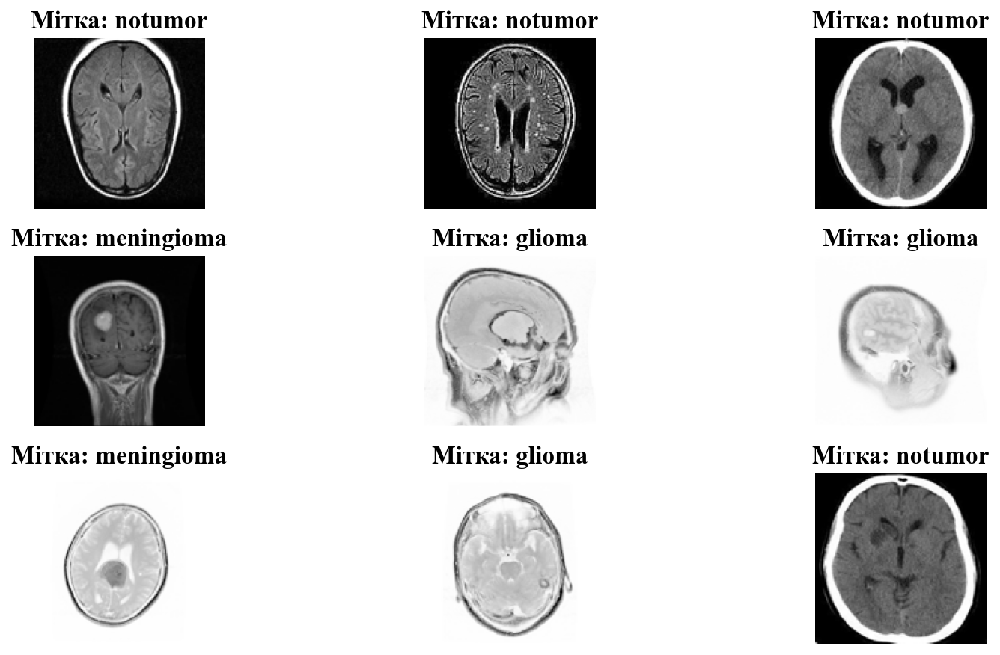


 ---------------------------------------------------------------------------

 ---------------------------------------------------------------------------


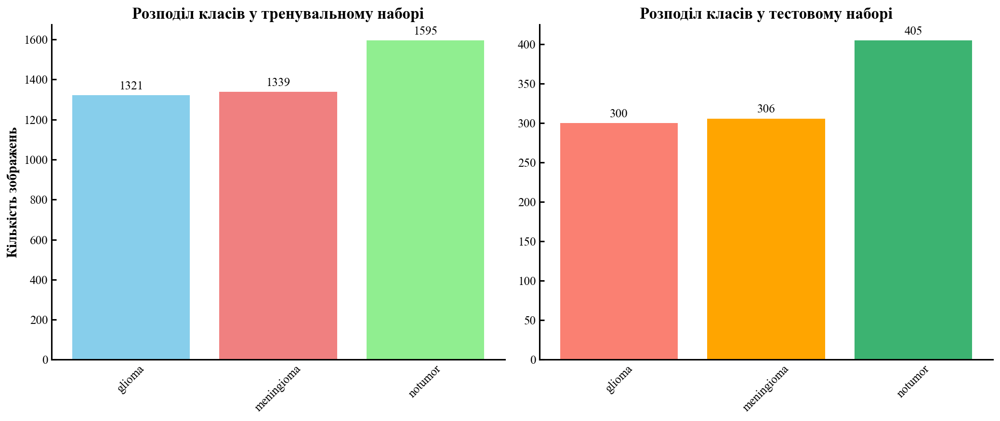


 ---------------------------------------------------------------------------
Визначені класи: ['glioma', 'meningioma', 'notumor']

МОДЕЛЬ: VGG16 для Transfer Learning
Зведення базової моделі VGG16:


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 7,079,424 (27.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)


Статус 'trainable' для шарів базової моделі:
Шар 0: input_layer_8, Здатний до навчання: False
Шар 1: block1_conv1, Здатний до навчання: False
Шар 2: block1_conv2, Здатний до навчання: False
Шар 3: block1_pool, Здатний до навчання: False
Шар 4: block2_conv1, Здатний до навчання: False
Шар 5: block2_conv2, Здатний до навчання: False
Шар 6: block2_pool, Здатний до навчання: False
Шар 7: block3_conv1, Здатний до навчання: False
Шар 8: block3_conv2, Здатний до навчання: False
Шар 9: block3_conv3, Здатний до навчання: False
Шар 10: block3_pool, Здатний до навчання: False
Шар 11: block4_conv1, Здатний до навчання: False
Шар 12: block4_conv2, Здатний до навчання: False
Шар 13: block4_conv3, Здатний до навчання: False
Шар 14: block4_pool, Здатний до навчання: False
Шар 15: block5_conv1, Здатний до навчання: True
Шар 16: block5_conv2, Здатний до навчання: True
Шар 17: block5_conv3, Здатний до навчання: True
Шар 18: block5_pool, Здатний до навчання: True

 ---------------------------------------

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 3)                   │             771 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,847,811 (56.64 MB)

 Trainable params: 7,212,035 (27.51 MB)

 Non-trainable params: 7,635,776 (29.13 MB)


 ---------------------------------------------------------------------------
Розпочинаємо навчання моделі...
Epoch 1/3
132/132 ━━━━━━━━━━━━━━━━━━━━ 628s 5s/step - accuracy: 0.7358 - loss: 0.6420 - val_accuracy: 0.8458 - val_loss: 0.4352 - learning_rate: 1.0000e-04
Epoch 2/3
132/132 ━━━━━━━━━━━━━━━━━━━━ 653s 5s/step - accuracy: 0.8873 - loss: 0.2994 - val_accuracy: 0.8458 - val_loss: 0.5418 - learning_rate: 1.0000e-04
Epoch 3/3
132/132 ━━━━━━━━━━━━━━━━━━━━ 618s 5s/step - accuracy: 0.9171 - loss: 0.2239 - val_accuracy: 0.9101 - val_loss: 0.2392 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 3.
Навчання моделі завершено.

--- Побудова графіків втрат та точності ---


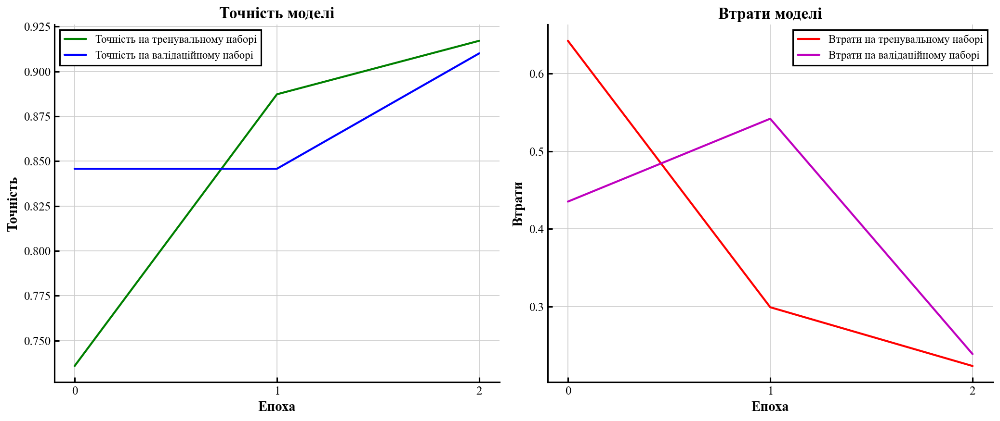


--- Генерація звіту про класифікацію ---
Виконуємо передбачення на тестовому наборі...
32/32 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step

Звіт про класифікацію:
              precision    recall  f1-score   support

      glioma       0.99      0.77      0.86       300
  meningioma       0.80      0.95      0.87       306
     notumor       0.96      0.99      0.97       405

    accuracy                           0.91      1011
   macro avg       0.92      0.90      0.90      1011
weighted avg       0.92      0.91      0.91      1011


 ---------------------------------------------------------------------------
--- Побудова матриці плутанини ---

Матриця плутанини:
[[230  68   2]
 [  1 290  15]
 [  1   4 400]]


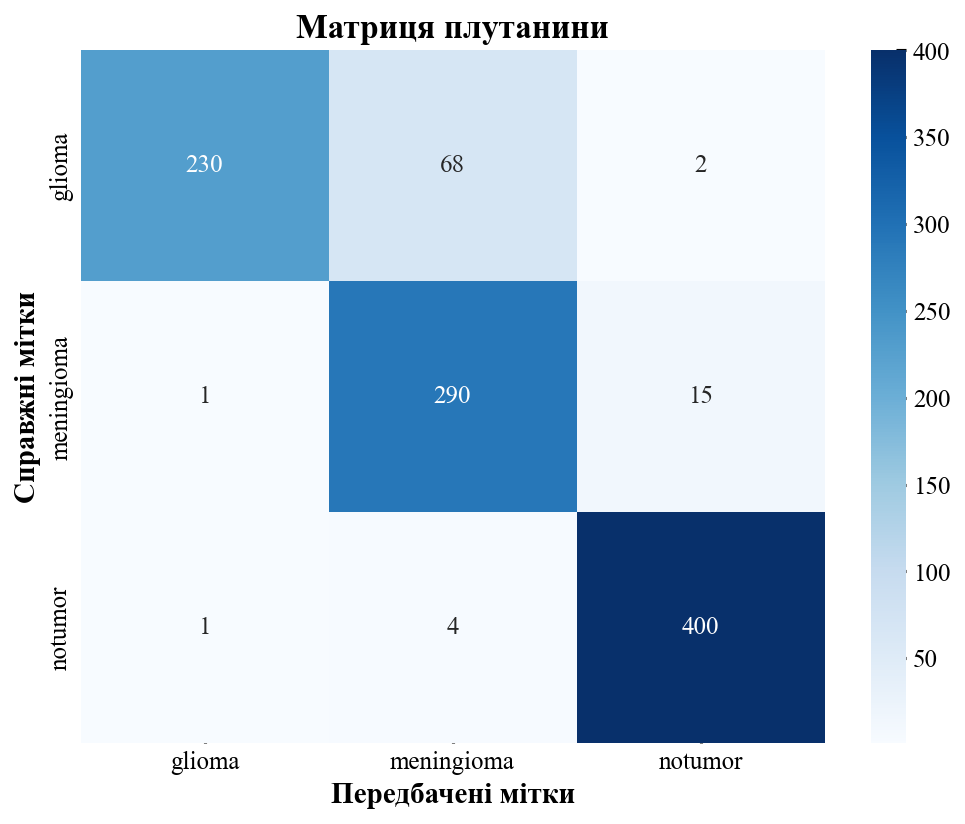


 ---------------------------------------------------------------------------
--- Побудова ROC-кривої ---


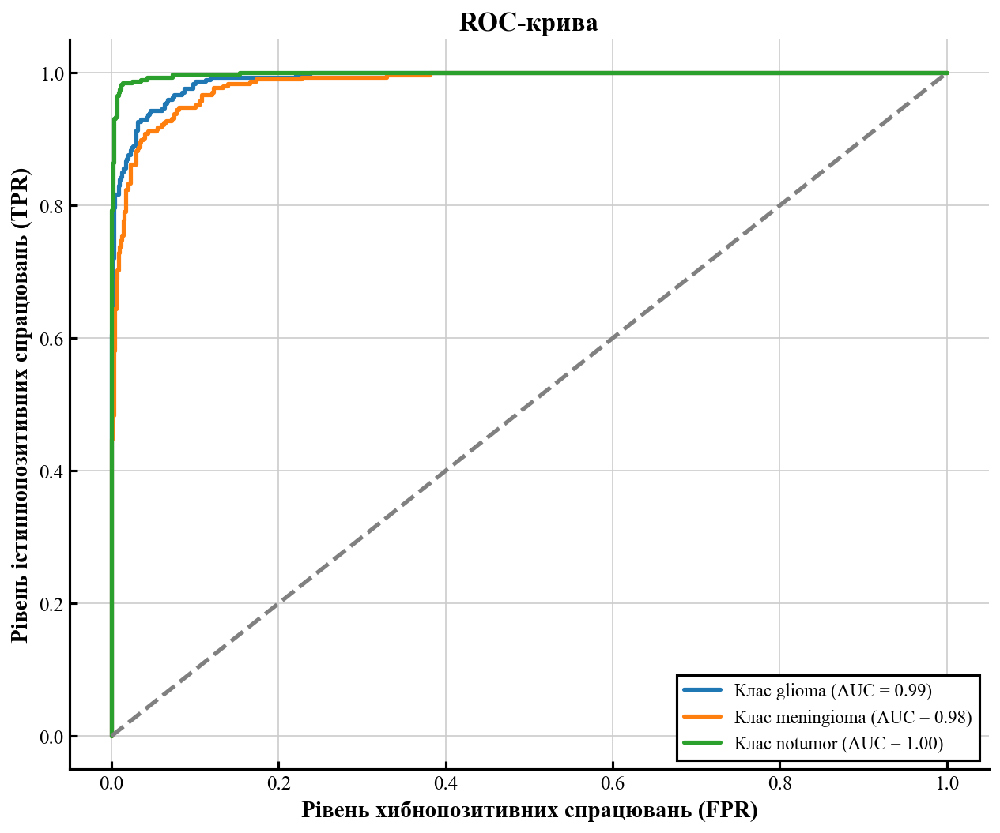


 ---------------------------------------------------------------------------
--- Збереження моделі ---
Модель успішно збережено як 'model.keras'.

 ---------------------------------------------------------------------------
--- Завантаження збереженої моделі ---
Модель успішно завантажено.

--- Система виявлення пухлин МРТ ---

ПРИКЛАДИ
--- Приклад 1: Зображення гліоми ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


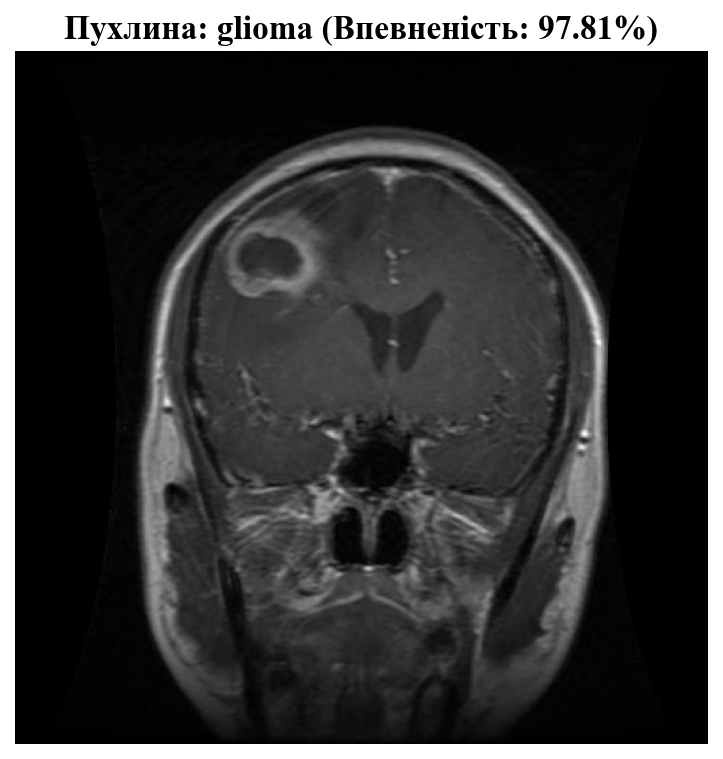


 ---------------------------------------------------------------------------
--- Приклад 2: Зображення менінгіоми ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


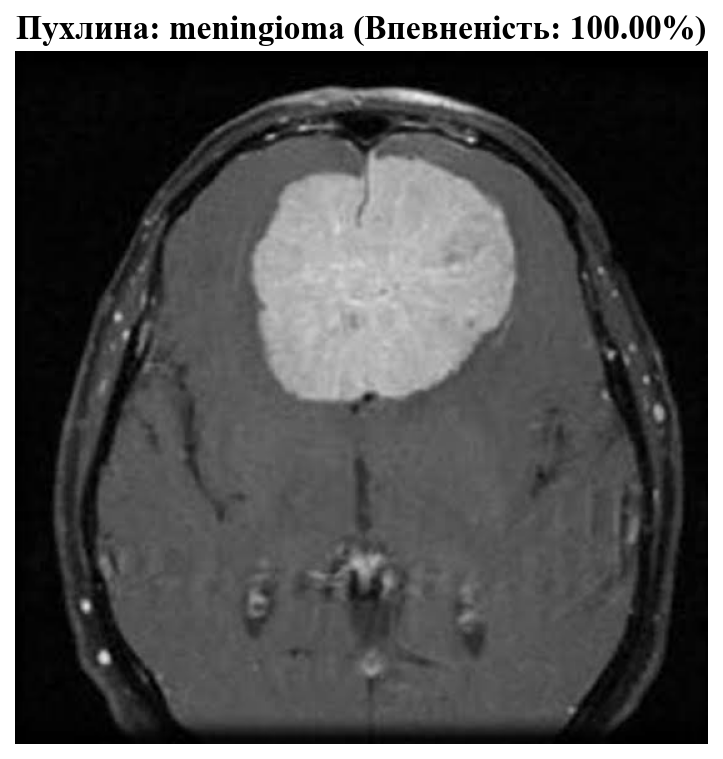


 ---------------------------------------------------------------------------
--- Приклад 3: Зображення без пухлини ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


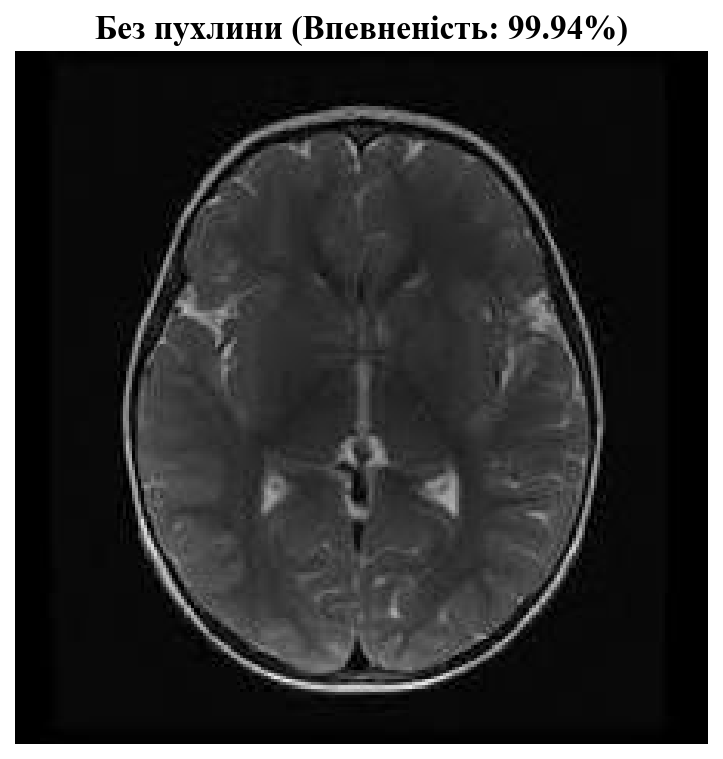


 ---------------------------------------------------------------------------


In [16]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Налаштуємо стиль для графіків Matplotlib.
plt.rcParams.update({
    'figure.dpi': 150,
    'savefig.dpi': 600,
    'savefig.format': 'pdf',
    'savefig.bbox': 'tight',
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold',
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 11,
    'legend.frameon': True,
    'legend.framealpha': 1.0,
    'legend.edgecolor': '#000000',
    'legend.fancybox': False,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.spines.left': True,
    'axes.spines.bottom': True,
    'axes.linewidth': 1.5,
    'axes.grid': False,
    'lines.linewidth': 2.5,
    'lines.markersize': 8,
    'patch.linewidth': 1.5,
    'patch.edgecolor': '#000000',
    'text.color': '#000000',
    'axes.labelcolor': '#000000',
    'axes.edgecolor': '#000000',
    'xtick.color': '#000000',
    'ytick.color': '#000000',
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'xtick.major.size': 5,
    'ytick.major.size': 5,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
})


import os
import random
from PIL import Image, ImageEnhance
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Flatten, Dropout, Dense, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16
from sklearn.utils import shuffle
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import load_model 

# --- Завантажемо базу даних ---
dataset_base_path = 'brain_tumor_classification' # Використовуємо коректну назву папки
train_dir = os.path.join(dataset_base_path, 'Training')
test_dir = os.path.join(dataset_base_path, 'Testing')

# Перевіремо наявності директорій
if not os.path.exists(train_dir):
    print(f"Помилка: Директорія для тренувальних даних не знайдена: {train_dir}")
    exit()
if not os.path.exists(test_dir):
    print(f"Помилка: Директорія для тестових даних не знайдена: {test_dir}")
    exit()

# Завантажемо та перемішаємо тренувальні дані
train_paths = []
train_labels = []
for label in os.listdir(train_dir):
    label_path = os.path.join(train_dir, label)
    if os.path.isdir(label_path): # Перевірка, чи це директорія
        for image_name in os.listdir(label_path):
            train_paths.append(os.path.join(label_path, image_name))
            train_labels.append(label)

train_paths, train_labels = shuffle(train_paths, train_labels, random_state=42) 

# Завантажемо тестові дані
test_paths = []
test_labels = []
for label in os.listdir(test_dir):
    label_path = os.path.join(test_dir, label)
    if os.path.isdir(label_path): # Перевірка, чи це директорія
        for image_name in os.listdir(label_path):
            test_paths.append(os.path.join(label_path, image_name))
            test_labels.append(label)

print(f"Кількість тренувальних зразків: {len(train_paths)}")
print(f"Кількість тестових зразків: {len(test_paths)}")


print("\n" + "="*80)
# --- Проведемо візуалізацію Даних ---
print("--- Візуалізація випадкових зображень з тренувального набору ---")
print("="*80)

# Виберемо випадкові індекси для 9 зображень
if len(train_paths) >= 9:
    sample_indices = random.sample(range(len(train_paths)), 9)
else:
    print(f"Недостатньо зображень у тренувальному наборі ({len(train_paths)}), щоб показати 9 прикладів.")
    sample_indices = range(len(train_paths)) # Показуємо всі, що є

plt.figure(figsize=(12, 6))

for i, sample_idx in enumerate(sample_indices):
    try:
        im = Image.open(train_paths[sample_idx]).resize((128, 128))

        plt.subplot(3, 3, i + 1)
        plt.imshow(im)
        plt.axis("off")
        plt.title(f"Мітка: {train_labels[sample_idx]}")
    except Exception as e:
        print(f"Помилка завантаження зображення {train_paths[sample_idx]}: {e}")
        plt.subplot(3, 3, i + 1)
        plt.text(0.5, 0.5, "Помилка завантаження", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis("off")


plt.tight_layout()
plt.show()
print("\n", "-" * 75)

# Створимео функцію для отримання кількості класів
def get_class_counts(directory):
    class_counts = {}
    for cls in os.listdir(directory):
        cls_path = os.path.join(directory, cls)
        if os.path.isdir(cls_path):
            class_counts[cls] = len(os.listdir(cls_path))
    return class_counts


train_counts = get_class_counts(train_dir)  # Кількість зображень у тренувальному наборі
test_counts = get_class_counts(test_dir)  # Кількість зображень у тестовому наборі
print("\n", "-" * 75)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Створимо графік розподілу класів для тренувального набору
bars1 = axes[0].bar(train_counts.keys(), train_counts.values(), color=["skyblue", "lightcoral", "lightgreen"])
axes[0].set_title("Розподіл класів у тренувальному наборі")
axes[0].set_ylabel("Кількість зображень")
axes[0].tick_params(axis='x', rotation=45)
axes[0].bar_label(bars1, padding=3)

# Створимо графік  розподілу класів для тестового набору
bars2 = axes[1].bar(test_counts.keys(), test_counts.values(), color=["salmon", "orange", "mediumseagreen"])
axes[1].set_title("Розподіл класів у тестовому наборі")
axes[1].tick_params(axis='x', rotation=45) # Повернув мітки для читабельності
axes[1].bar_label(bars2, padding=3) # Додав відступ для міток

plt.tight_layout() # Автоматичне налаштування відступів
plt.show()
print("\n", "-" * 75)

# --- Проведемо попередню обробку Зображень ---
# Розмір зображення для моделі VGG16
IMAGE_SIZE = 224

# Створимо функцію аугментації зображення
def augment_image(image_array_normalized):

    # Перетворюємо назад до 0-255 та uint8 для роботи з PIL.Image та ImageEnhance
    image_pil = Image.fromarray((image_array_normalized * 255).astype(np.uint8))

    # Випадкова зміна яскравості та контрасту
    image_pil = ImageEnhance.Brightness(image_pil).enhance(random.uniform(0.8, 1.2))
    image_pil = ImageEnhance.Contrast(image_pil).enhance(random.uniform(0.8, 1.2))

    # Додаткові аугментації
    if random.random() < 0.5:
        image_pil = image_pil.rotate(random.randint(-10, 10))
    # Горизонтальне відображення (якщо симетрія мозку це дозволяє)
    if random.random() < 0.5:
        image_pil = image_pil.transpose(Image.FLIP_LEFT_RIGHT)
    # Зсув по осях
    if random.random() < 0.5:
        dx, dy = random.randint(-5, 5), random.randint(-5, 5)
        image_pil = image_pil.transform(image_pil.size, Image.AFFINE, (1, 0, dx, 0, 1, dy))


    # Після всіх аугментацій перетворюємо назад на numpy масив та нормалізуємо до [0, 1]
    image_augmented_array = np.array(image_pil) / 255.0
    return image_augmented_array

# Проведемо завантаження зображень та застосування аугментації (тільки для тренування)
def open_images(paths, augment=False): 
    images = []
    for path in paths:
        # Завантажуємо зображення та змінюємо розмір
        image = load_img(path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
        image_array = img_to_array(image) # Перетворюємо на масив numpy (буде float32)

        # Нормалізуємо до [0, 1] ПЕРЕД тим, як передати в augment_image, або просто для тестових
        image_array_normalized = image_array / 255.0

        if augment: 
            image_array_processed = augment_image(image_array_normalized)
        else:
            image_array_processed = image_array_normalized 

        images.append(image_array_processed)
    return np.array(images)

# Проведемо кодування міток (перетворення назв міток на цілі числа)
unique_labels = sorted(os.listdir(train_dir)) 
num_classes = len(unique_labels)
print(f"Визначені класи: {unique_labels}")

def encode_label(labels):
    # Створюємо мапування міток до індексів
    label_to_int = {label: i for i, label in enumerate(unique_labels)}
    encoded = [label_to_int[label] for label in labels]
    return np.array(encoded)

# Генератор даних для батчів
def datagen(paths, labels, batch_size=12, epochs=1, augment=False): 
    for _ in range(epochs):
        # Перемішуємо дані на початку кожної епохи для кращого навчання
        paths_shuffled, labels_shuffled = shuffle(paths, labels, random_state=None)
        for i in range(0, len(paths_shuffled), batch_size):
            batch_paths = paths_shuffled[i:i + batch_size]
            batch_images = open_images(batch_paths, augment=augment) 
            batch_labels = labels_shuffled[i:i + batch_size]
            batch_labels = encode_label(batch_labels)
            yield batch_images, batch_labels


# --- МОДЕЛЬ: VGG16 для Transfer Learning ---
print("\n" + "="*80)
print("МОДЕЛЬ: VGG16 для Transfer Learning")
print("="*80)

base_model = VGG16(
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
    include_top=False, # Не включаємо верхні (класифікаційні) шари
    weights='imagenet' # Використовуємо ваги, навчені на ImageNet
)

# Заморожуємо більшість шарів базової моделі VGG16
# Розморожуємо лише останні 4 шари для донавчання (fine-tuning)
for layer in base_model.layers:
    layer.trainable = False # Заморожуємо всі шари спочатку

# Розморожуємо останні 4 шари. Це block5_conv1, block5_conv2, block5_conv3, block5_pool.
# Це дозволяє доналаштувати їх під особливості медичних зображень.
for layer in base_model.layers[-4:]:
    layer.trainable = True

print("Зведення базової моделі VGG16:")
base_model.summary()


print("\nСтатус 'trainable' для шарів базової моделі:")
for i, layer in enumerate(base_model.layers):
    print(f"Шар {i}: {layer.name}, Здатний до навчання: {layer.trainable}")
print("\n", "-" * 75)

# Проведемо побудову моделі Transfer Learning
model = Sequential([
    base_model, # Вбудовуємо попередньо навчену модель VGG16
    GlobalAveragePooling2D(), # Зменшення просторових розмірів до вектора
    Dropout(0.5), # Регуляризація: випадково "відключає" нейрони, щоб запобігти перенавчанню
    Dense(256, activation='relu'), # Повнозв'язний шар з 256 нейронами та ReLU активацією
    BatchNormalization(), # Нормалізація виходів для стабілізації навчання
    Dropout(0.3), # Додатковий шар регуляризації
    Dense(num_classes, activation='softmax') 
]) # Вихідний шар з кількістю нейронів, рівною кількості класів, softmax для багатокласової класифікації

# Проведемо компіляцію моделі
model.compile(optimizer=Adam(learning_rate=0.0001), # Оптимізатор Adam з низьким темпом навчання
              loss='sparse_categorical_crossentropy', # Функція втрат для багатокласової класифікації з цілими мітками
              metrics=['accuracy']) # Метрика для оцінки ефективності - точність

print("Зведення кінцевої моделі:")
model.summary()
print("\n", "-" * 75)

# --- Проведемо навчання Моделі ---
batch_size = 32
# Проведемо перевірки
train_steps = len(train_paths) // batch_size if len(train_paths) > 0 else 1
val_steps = len(test_paths) // batch_size if len(test_paths) > 0 else 1

epochs = 3 # Кількість епох для навчання має бути 30-40, поставив 3 , бо комп слабкий

# Колбеки для покращення процесу навчання
# EarlyStopping: Зупиняє навчання, якщо валідаційна втрата не покращується протягом 10 епох
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
# ReduceLROnPlateau: Зменшує темп навчання, якщо валідаційна втрата не покращується
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1)

print("Розпочинаємо навчання моделі...")
history = model.fit(
    datagen(train_paths, train_labels, batch_size=batch_size, epochs=epochs, augment=True), # Аугментація для тренувальних даних
    epochs=epochs,
    steps_per_epoch=train_steps,
    validation_data=datagen(test_paths, test_labels, batch_size=batch_size, epochs=epochs, augment=False), # БЕЗ аугментації для валідаційних даних
    validation_steps=val_steps,
    callbacks=[early_stop, reduce_lr]
)
print("Навчання моделі завершено.")

print("\n" + "="*80)
# --- Проведемо графіки Втрат та Точності ---
print("--- Побудова графіків втрат та точності ---")
print("="*80)

plt.figure(figsize=(14, 6)) 

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], 'g-', linewidth=2, label='Точність на тренувальному наборі')
plt.plot(history.history['val_accuracy'], 'b-', linewidth=2, label='Точність на валідаційному наборі')
plt.title('Точність моделі')
plt.xlabel('Епоха')
plt.ylabel('Точність')
# Перевіряємо, чи кількість епох дійсно відповідає довжині історії
if len(history.history['accuracy']) < epochs:
    plt.xticks(range(len(history.history['accuracy'])))
else:
    plt.xticks(range(epochs))
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], 'r-', linewidth=2, label='Втрати на тренувальному наборі')
plt.plot(history.history['val_loss'], 'm-', linewidth=2, label='Втрати на валідаційному наборі')
plt.title('Втрати моделі')
plt.xlabel('Епоха')
plt.ylabel('Втрати')
# Перевіряємо, чи кількість епох дійсно відповідає довжині історії
if len(history.history['loss']) < epochs:
    plt.xticks(range(len(history.history['loss'])))
else:
    plt.xticks(range(epochs))
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


print("\n" + "="*80)
# --- Проведемо звіт про Класифікацію Моделі ---
print("--- Генерація звіту про класифікацію ---")
print("="*80)

# 1. Проведемо передбачення на тестових даних
# Завантажуємо тестові зображення без аугментації
test_images_for_prediction = open_images(test_paths, augment=False)
test_labels_encoded = encode_label(test_labels)  # Кодуємо мітки тестового набору

# Робимо передбачення за допомогою навченої моделі
print("Виконуємо передбачення на тестовому наборі...")
test_predictions = model.predict(test_images_for_prediction)
predicted_classes = np.argmax(test_predictions, axis=1) # Отримуємо індекс класу з найвищою ймовірністю

# 2. Проведемо звіт про класифікацію
print("\nЗвіт про класифікацію:")
# Використовуємо unique_labels для назв класів
print(classification_report(test_labels_encoded, predicted_classes, target_names=unique_labels))


print("\n", "-" * 75)
# --- Створимо графік Матриці Плутанини ---
print("--- Побудова матриці плутанини ---")
# 3. Створимо г матрицю плутанини
conf_matrix = confusion_matrix(test_labels_encoded, predicted_classes)
print("\nМатриця плутанини:")
print(conf_matrix)

# Побудуємо теплову карту матриці плутанини
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=unique_labels, yticklabels=unique_labels)
plt.title("Матриця плутанини")
plt.xlabel("Передбачені мітки")
plt.ylabel("Справжні мітки")
plt.show()

print("\n", "-" * 75)
# --- Створимо графік ROC-кривої ---
print("--- Побудова ROC-кривої ---")

# 4. ROC-крива та AUC
test_labels_bin = label_binarize(test_labels_encoded, classes=np.arange(num_classes))

# Обчислимо ROC-криву та ROC AUC для кожного класу
fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], test_predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Побудуємо ROC-криву
plt.figure(figsize=(10, 8))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Клас {unique_labels[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # Діагональна лінія (випадковий класифікатор)
plt.title("ROC-крива")
plt.xlabel("Рівень хибнопозитивних спрацювань (FPR)")
plt.ylabel("Рівень істиннопозитивних спрацювань (TPR)")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

print("\n", "-" * 75)
# --- Проведемо збереження та Завантаження Моделі ---
print("--- Збереження моделі ---")
try:
    model.save('model.keras') # Збереження моделі у форматі Keras
    print("Модель успішно збережено як 'model.keras'.")
except Exception as e:
    print(f"Помилка при збереженні моделі: {e}")

print("\n", "-" * 75)
print("--- Завантаження збереженої моделі ---")
try:
    # Завантажимо збережену модель для подальшого використання
    loaded_model = load_model('model.keras')
    print("Модель успішно завантажено.")
except Exception as e:
    print(f"Помилка при завантаженні моделі: {e}")
    loaded_model = model
    print("Буде використовуватися модель, що знаходиться в пам'яті.")


print("\n" + "="*80)
# --- Запустимо систему Виявлення Пухлин МРТ ---
print("--- Система виявлення пухлин МРТ ---")
print("="*80)

class_labels_for_display = unique_labels

def detect_and_display(img_path, model_to_use, image_size=224):
    try:
        # Проведемо завантаження та попередня обробка зображення
        img = load_img(img_path, target_size=(image_size, image_size))
        img_array = img_to_array(img) / 255.0  # Нормалізація пікселів до [0, 1]
        img_array = np.expand_dims(img_array, axis=0)  # Додавання розмірності батчу

        # Робимо передбачення
        predictions = model_to_use.predict(img_array)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        confidence_score = np.max(predictions, axis=1)[0]

        # Визначемо результату
        predicted_label = class_labels_for_display[predicted_class_index]
        if predicted_label == 'notumor':
            result = "Без пухлини"
        else:
            result = f"Пухлина: {predicted_label}"

        # Відобразимо зображення з передбаченням
        plt.figure(figsize=(6, 6)) 
        plt.imshow(load_img(img_path))
        plt.axis('off')
        plt.title(f"{result} (Впевненість: {confidence_score * 100:.2f}%)")
        plt.show()

    except FileNotFoundError:
        print(f"Помилка: Файл не знайдено за шляхом: {img_path}. Перевірте шлях до зображення.")
    except IndexError:
        print(f"Помилка індексування: Клас з індексом {predicted_class_index} не знайдено в {class_labels_for_display}.")
    except Exception as e:
        print("Помилка обробки зображення:", str(e))


# На основі прикладів провіримо модель 
print("\n" + "="*80)
print("ПРИКЛАДИ")
print("="*80)
print("--- Приклад 1: Зображення гліоми ---")
# Перевірте, чи існують ці шляхи у вашій папці 'brain_tumor_classification'
path1 = 'brain_tumor_classification/Testing/glioma/Te-gl_0066.jpg'
detect_and_display(path1, loaded_model)

print("\n", "-" * 75)
print("--- Приклад 2: Зображення менінгіоми ---")
path2 = 'brain_tumor_classification/Testing/meningioma/Te-me_0068.jpg'
detect_and_display(path2, loaded_model)

print("\n", "-" * 75)
print("--- Приклад 3: Зображення без пухлини ---")
path3 = 'brain_tumor_classification/Testing/notumor/Te-no_0124.jpg'
detect_and_display(path3, loaded_model)

print("\n", "-" * 75)